In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import altair as alt
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# Read data from raw file
telco_churn_df = pd.read_csv('../data/raw/IBM-Telco-Customer-Churn.csv')
telco_churn_df.shape

(7043, 21)

In [3]:
# train_test_split before EDA
train_df, test_df = train_test_split(telco_churn_df, test_size=0.3, random_state=1)

In [4]:
# Looking into the data
train_df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
5925,1840-BIUOG,Male,0,No,No,20,Yes,Yes,DSL,No,...,No,Yes,Yes,No,One year,Yes,Electronic check,68.70,1416.2,No
4395,5502-RLUYV,Female,0,Yes,Yes,69,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,103.95,7446.9,Yes
1579,9391-EOYLI,Male,1,Yes,No,12,Yes,No,Fiber optic,No,...,No,No,No,Yes,Month-to-month,Yes,Electronic check,80.45,950.2,Yes
1040,1236-WFCDV,Male,1,No,No,14,Yes,No,Fiber optic,No,...,No,No,Yes,Yes,Month-to-month,No,Credit card (automatic),90.45,1266.1,Yes
1074,2111-DWYHN,Male,0,No,No,1,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,21.10,21.1,No


In [5]:
# There are 20 columns in the dataframe, out of which only 3 are numeric
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4930 entries, 5925 to 5157
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        4930 non-null   object 
 1   gender            4930 non-null   object 
 2   SeniorCitizen     4930 non-null   int64  
 3   Partner           4930 non-null   object 
 4   Dependents        4930 non-null   object 
 5   tenure            4930 non-null   int64  
 6   PhoneService      4930 non-null   object 
 7   MultipleLines     4930 non-null   object 
 8   InternetService   4930 non-null   object 
 9   OnlineSecurity    4930 non-null   object 
 10  OnlineBackup      4930 non-null   object 
 11  DeviceProtection  4930 non-null   object 
 12  TechSupport       4930 non-null   object 
 13  StreamingTV       4930 non-null   object 
 14  StreamingMovies   4930 non-null   object 
 15  Contract          4930 non-null   object 
 16  PaperlessBilling  4930 non-null   objec

In [6]:
# Summary statistics for numeric features
telco_churn_df.describe()

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


In [7]:
# No missing values in the training data
train_df.isnull().values.any()

False

In [8]:
# Value distribution for target class
train_df["Churn"].value_counts()

No     3589
Yes    1341
Name: Churn, dtype: int64

In [9]:
# Data wrangling: convert TotalCharges to numeric, dropna rows and drop CustomerId and gender column
train_df['TotalCharges'] = pd.to_numeric(train_df['TotalCharges'], errors='coerce')
train_df['SeniorCitizen'] = train_df['SeniorCitizen'].astype(str)
train_df = train_df.dropna().drop(columns = ['customerID', 'gender'])
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4922 entries, 5925 to 5157
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   SeniorCitizen     4922 non-null   object 
 1   Partner           4922 non-null   object 
 2   Dependents        4922 non-null   object 
 3   tenure            4922 non-null   int64  
 4   PhoneService      4922 non-null   object 
 5   MultipleLines     4922 non-null   object 
 6   InternetService   4922 non-null   object 
 7   OnlineSecurity    4922 non-null   object 
 8   OnlineBackup      4922 non-null   object 
 9   DeviceProtection  4922 non-null   object 
 10  TechSupport       4922 non-null   object 
 11  StreamingTV       4922 non-null   object 
 12  StreamingMovies   4922 non-null   object 
 13  Contract          4922 non-null   object 
 14  PaperlessBilling  4922 non-null   object 
 15  PaymentMethod     4922 non-null   object 
 16  MonthlyCharges    4922 non-null   float

In [10]:
# NUMERIC FEATURES
# Distribution of numerical features
alt.Chart(train_df).mark_bar().encode(
     alt.X(alt.repeat(), type='quantitative', bin=alt.Bin(maxbins=40)),
     alt.Y('count()', title='Count'),
).properties(
    width=300,
    height=200
).repeat(
    ['tenure', 'MonthlyCharges', 'TotalCharges']
)

alt.RepeatChart(...)

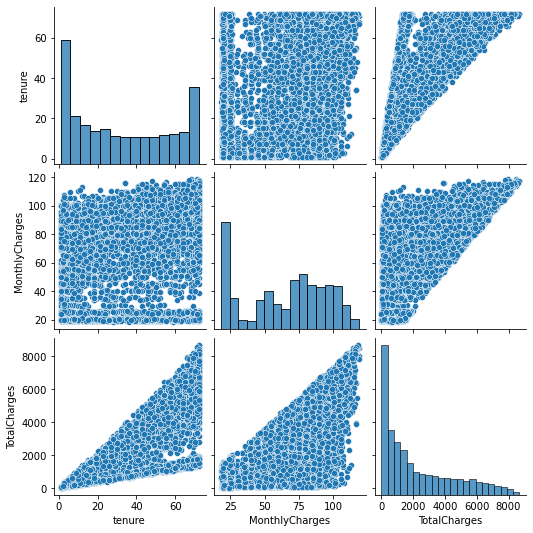

In [11]:
sns.pairplot(train_df)

In [12]:
train_df.corr()

,tenure,MonthlyCharges,TotalCharges
tenure,1.000000,0.251746,0.827933
MonthlyCharges,0.251746,1.000000,0.651976
TotalCharges,0.827933,0.651976,1.000000


In [13]:
# CATEGORICAL FEATURES
# Summary of unique categories for all features
train_cat = train_df.select_dtypes(include='object').copy().drop(columns=['Churn'])

catfeatures_stats = pd.DataFrame(columns=['column', 'values', 'unique_values', 'missing'])

tmp = pd.DataFrame()

for c in train_cat.columns:
    tmp['column'] = [c]
    tmp['values'] = [train_cat[c].unique()]
    tmp['unique_values'] = int(train_cat[c].nunique())
    tmp['missing'] = train_cat[c].isnull().sum()
    catfeatures_stats = catfeatures_stats.append(tmp)

catfeatures_stats

,column,values,unique_values,missing
0,SeniorCitizen,"[0, 1]",2,0
0,Partner,"[No, Yes]",2,0
0,Dependents,"[No, Yes]",2,0
0,PhoneService,"[Yes, No]",2,0
0,MultipleLines,"[Yes, No, No phone service]",3,0
0,InternetService,"[DSL, Fiber optic, No]",3,0
0,OnlineSecurity,"[No, No internet service, Yes]",3,0
0,OnlineBackup,"[Yes, No, No internet service]",3,0
0,DeviceProtection,"[No, Yes, No internet service]",3,0
0,TechSupport,"[Yes, No, No internet service]",3,0


In [14]:
# Distribution across various categorical features
alt.Chart(train_df).mark_bar().encode(
     alt.Y(alt.repeat(), type='nominal'),
     x='count()',
).properties(
    width=150,
    height=80
).repeat(
    ['SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 
     'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 
     'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 
     'Contract', 'PaperlessBilling', 'PaymentMethod'], 
    columns = 4
)

alt.RepeatChart(...)

C:\Users\anupr\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\anupr\miniconda3\lib\site-packages\seaborn\categorical.py:3775: UserWarning: catplot is a figure-level function and does not accept target axes. You may wish to try countplot
  warnings.warn(msg, UserWarning)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
C:\Users\anupr\AppData\Local\Temp/ipykernel_9408/93149281.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(["No", "Yes"])


Text(0.5, 0.98, 'Phone Service vs. Churn')

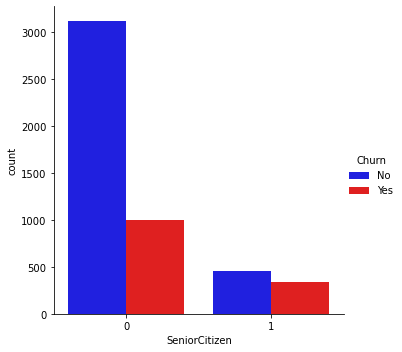

In [15]:
fig, ax = plt.subplots()

sns.catplot("SeniorCitizen", hue="Churn", data=train_df, kind="count", palette=['blue', 'red'], ax=ax)

plt.close(1) 

ax.legend(title="Senior Citizen")
ax.set_xticklabels(["No", "Yes"])
ax.set_xlabel("")

fig.suptitle("Phone Service vs. Churn")

In [16]:
alt.Chart(train_df).mark_bar().encode(
    alt.X('count()', title='Count'),
    alt.Y('SeniorCitizen'),
    alt.Color('Churn')
).properties(
    height=100
).facet(
    'Churn',
    columns=2
)

alt.FacetChart(...)

In [17]:
alt.Chart(train_df).mark_bar().encode(
    alt.X('count()', title='Count'),
    alt.Y('Partner'),
    alt.Color('Churn')
).properties(
    height=100
).facet(
    'Churn',
    columns=2
)

alt.FacetChart(...)

In [18]:
alt.Chart(train_df).mark_bar().encode(
    alt.X('count()', title='Count'),
    alt.Y('Dependents'),
    alt.Color('Churn')
).properties(
    height=100
).facet(
    'Churn',
    columns=2
)

alt.FacetChart(...)

In [19]:
# Evaluating high Churn categories for Telco services
# Customers with Fiber Optic service have highest Churn rate
alt.Chart(train_df[['InternetService', 'Churn']]).mark_square().encode(
    x='InternetService',
    y='Churn',
    color='count()',
    size='count()').properties(
    width=150,
    height=80)

alt.Chart(...)

In [20]:
# Churn is similarly distributed for people with and without Multiple Lines
alt.Chart(train_df[['MultipleLines', 'Churn']]).mark_square().encode(
    x='MultipleLines',
    y='Churn',
    color='count()',
    size='count()').properties(
    width=150,
    height=80)

alt.Chart(...)

In [21]:
# Customers with No Online Security have higher Churn
alt.Chart(train_df[['OnlineSecurity', 'Churn']]).mark_square().encode(
    x='OnlineSecurity',
    y='Churn',
    color='count()',
    size='count()').properties(
    width=150,
    height=80)

alt.Chart(...)

In [22]:
# Customers with No Online Backup have higher Churn
alt.Chart(train_df[['OnlineBackup', 'Churn']]).mark_square().encode(
    x='OnlineBackup',
    y='Churn',
    color='count()',
    size='count()').properties(
    width=150,
    height=80)

alt.Chart(...)

In [23]:
# Customers with No Device Protection have higher Churn
alt.Chart(train_df[['DeviceProtection', 'Churn']]).mark_square().encode(
    x='DeviceProtection',
    y='Churn',
    color='count()',
    size='count()').properties(
    width=150,
    height=80)

alt.Chart(...)

In [24]:
# Customers with No Technical Support have higher Churn
alt.Chart(train_df[['TechSupport', 'Churn']]).mark_square().encode(
    x='TechSupport',
    y='Churn',
    color='count()',
    size='count()').properties(
    width=150,
    height=80)

alt.Chart(...)

In [25]:
# Churn is similarly distributed for customers with and without Streaming TV
alt.Chart(train_df[['StreamingTV', 'Churn']]).mark_square().encode(
    x='StreamingTV',
    y='Churn',
    color='count()',
    size='count()').properties(
    width=150,
    height=80)

alt.Chart(...)

In [26]:
# Churn is similarly distributed for customers with and without Streaming Movies
alt.Chart(train_df[['StreamingMovies', 'Churn']]).mark_square().encode(
    x='StreamingMovies',
    y='Churn',
    color='count()',
    size='count()').properties(
    width=150,
    height=80)

alt.Chart(...)

In [27]:
# Customers with monthly contract have the highest Churn rate
alt.Chart(train_df[['Contract', 'Churn']]).mark_square().encode(
    x='Contract',
    y='Churn',
    color='count()',
    size='count()').properties(
    width=150,
    height=80)

alt.Chart(...)

In [28]:
# Customers with Paperless Billing have higher Churn
alt.Chart(train_df[['PaperlessBilling', 'Churn']]).mark_square().encode(
    x='PaperlessBilling',
    y='Churn',
    color='count()',
    size='count()').properties(
    width=150,
    height=80)

alt.Chart(...)

In [29]:
# Customers with payment method of Electronic Check have higher Churn
alt.Chart(train_df[['PaymentMethod', 'Churn']]).mark_square().encode(
    x='PaymentMethod',
    y='Churn',
    color='count()',
    size='count()').properties(
    width=150,
    height=80)

alt.Chart(...)

In [30]:
# Supplementry Analysis using Pandas profiling
from pandas_profiling import ProfileReport
prof = ProfileReport(train_df)
prof.to_file(output_file='telco_churn_feature_profile.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]